In [9]:
import hdbscan
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import seaborn as sns
from clustering_hyperparams import get_hyperparameters

In [10]:
with open('bsc-3m/traj_01_elab.pkl', 'rb') as f:
    df = pickle.load(f)
df = df.loc[df['class'] == 'Car']
x = df[['x0', 'y0', 'x1', 'y1']].to_numpy()

In [11]:
min_cluster_size, min_samples, cluster_selection_epsilon = get_hyperparameters('Car', '')
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=min_cluster_size,
    min_samples=min_samples,
    cluster_selection_epsilon=cluster_selection_epsilon
)
xc = np.array(clusterer.fit_predict(x))
df['cluster'] = xc

plotting all clusters
plotting cluster -1
plotting cluster 0
plotting cluster 1
plotting cluster 2
plotting cluster 3
plotting cluster 4
plotting cluster 5
plotting cluster 6
plotting cluster 7
plotting cluster 8
plotting cluster 9
plotting cluster 10
plotting cluster 11


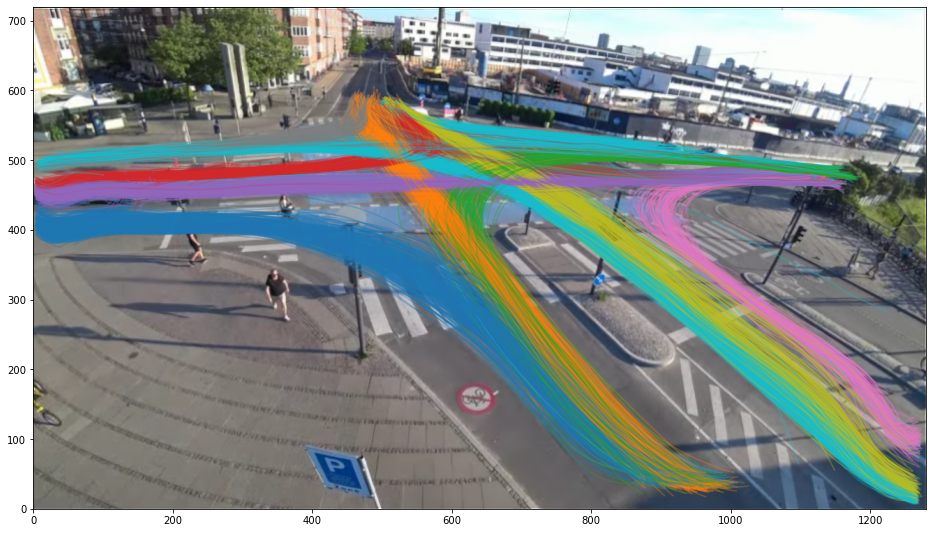

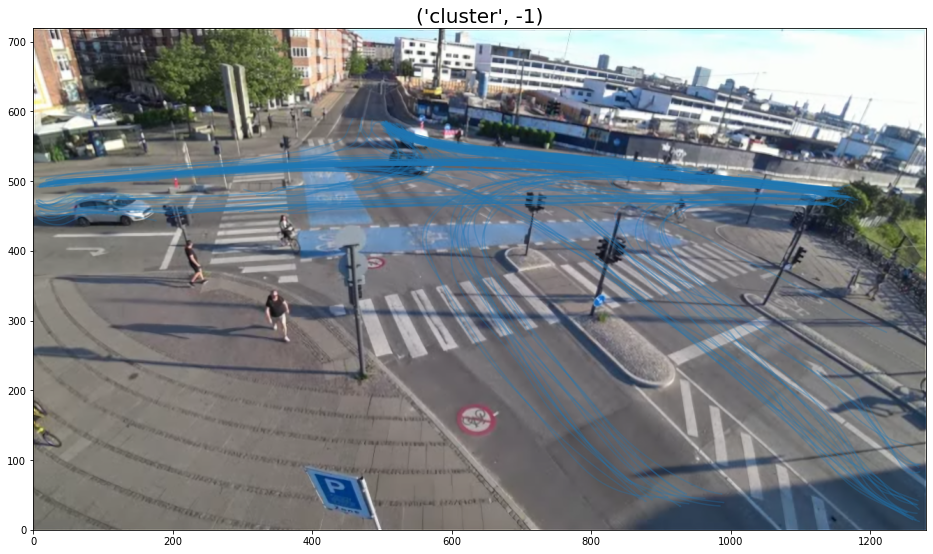

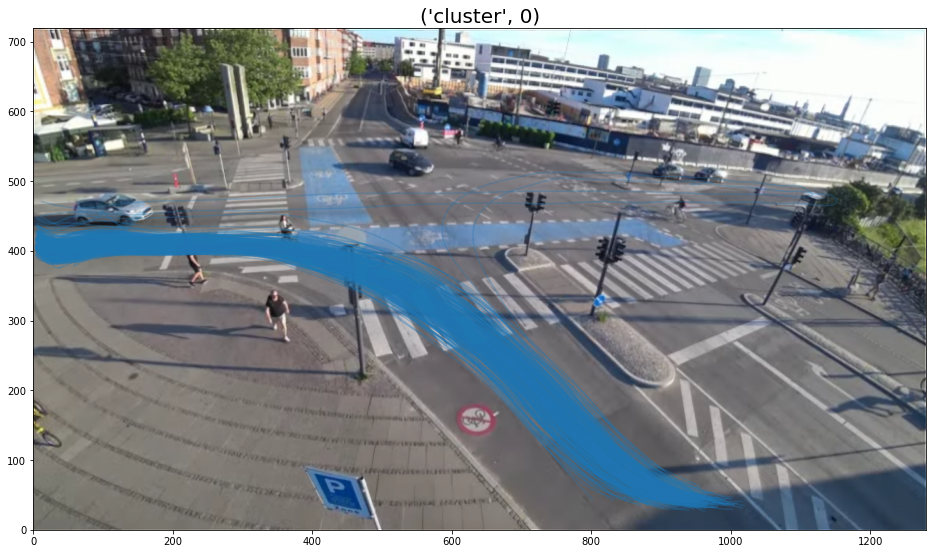

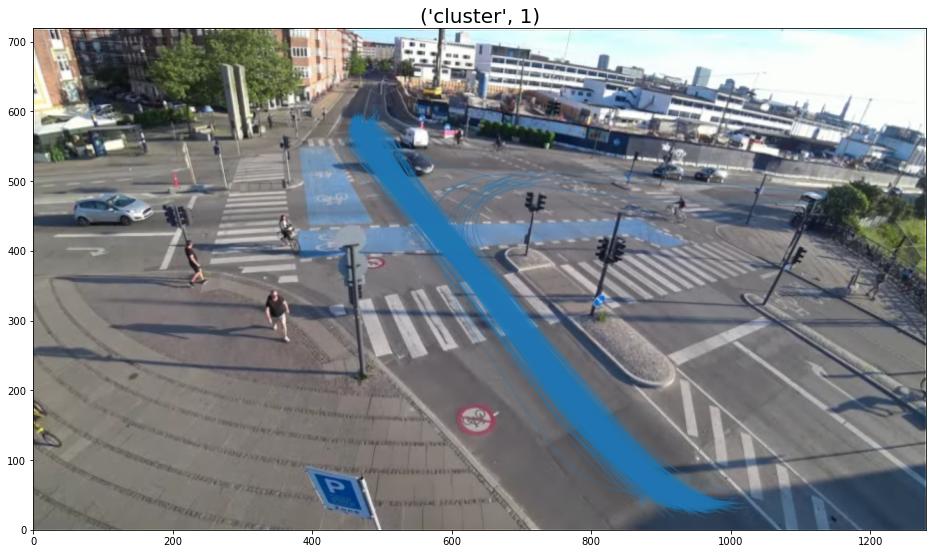

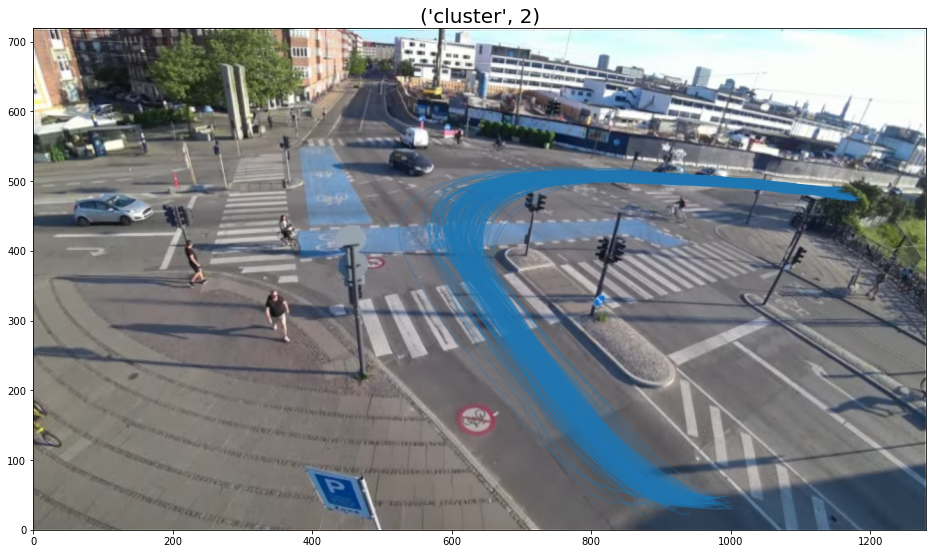

...

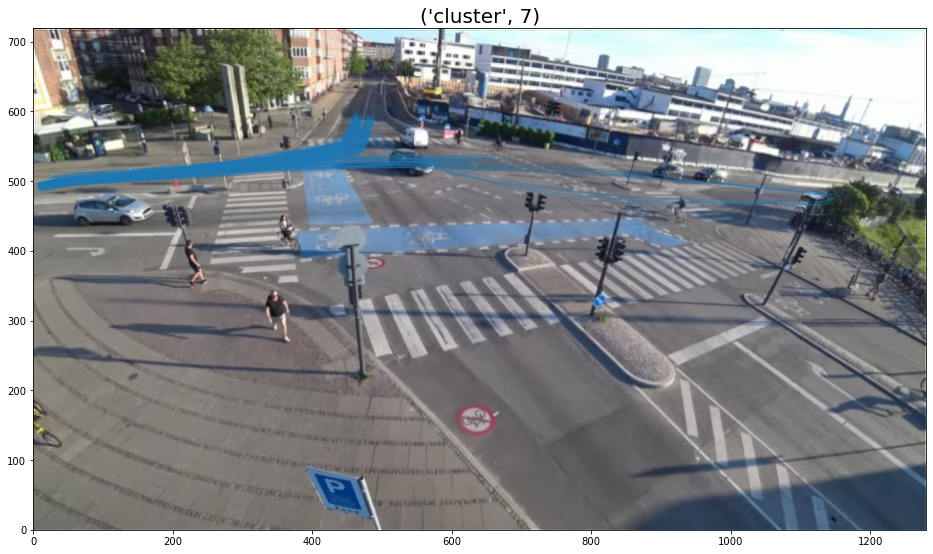

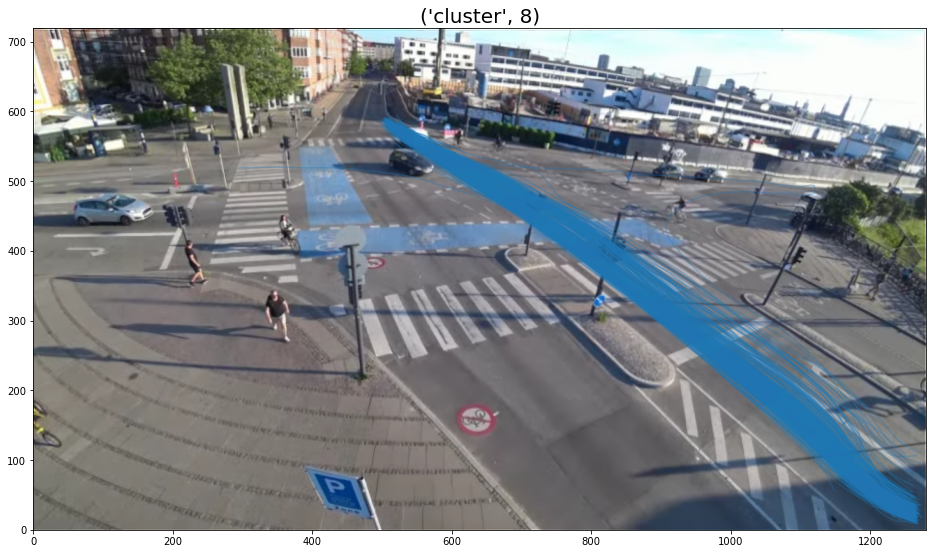

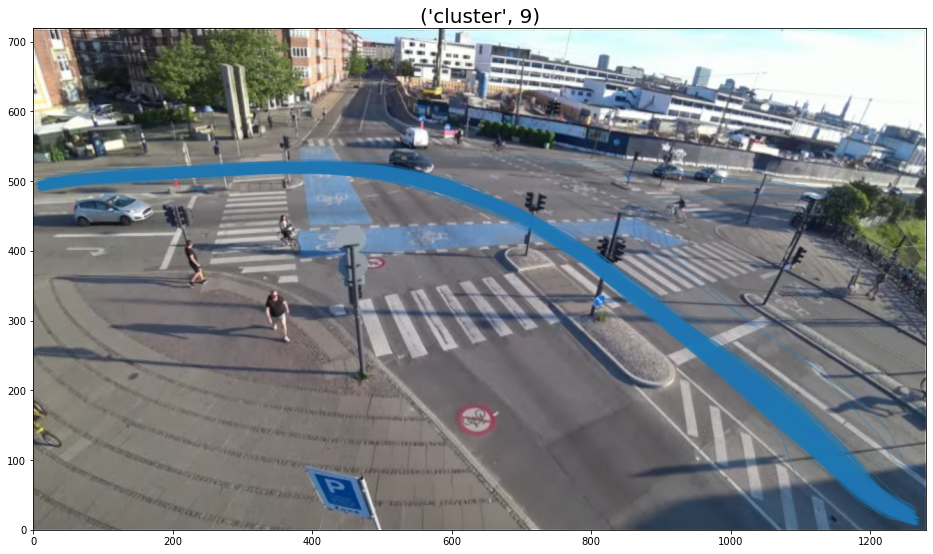

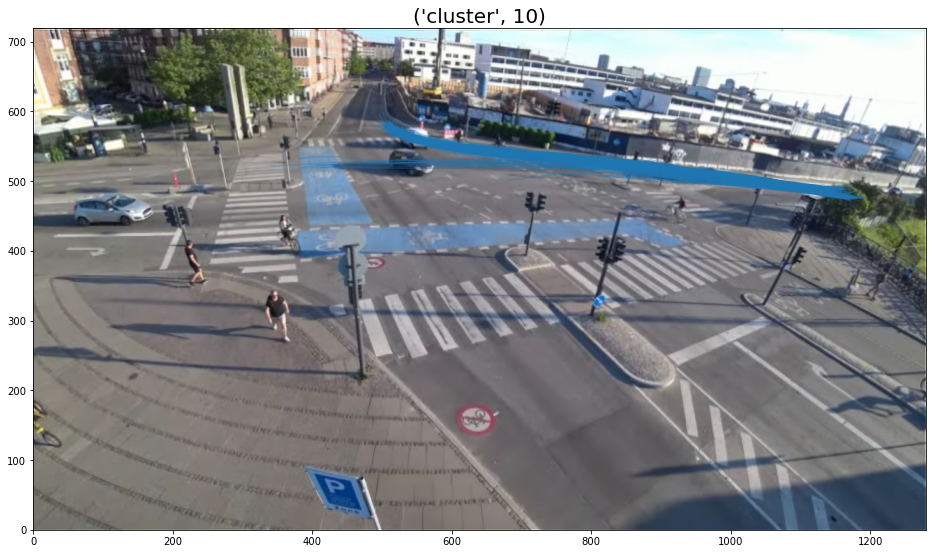

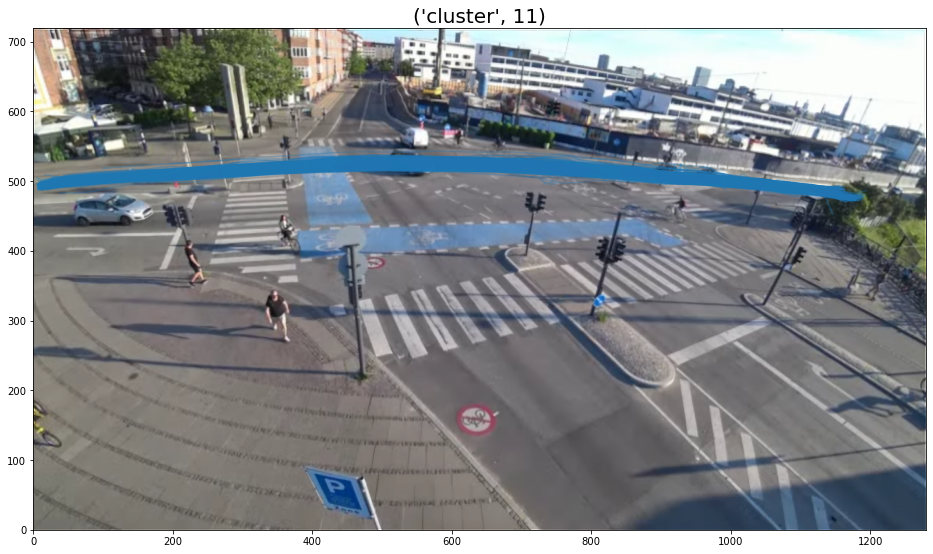

In [14]:
# MAKING ALL CLUSTER INCLUDING OUTLIERS!
col = sns.color_palette()
print('plotting all clusters')
fig, ax = plt.subplots(figsize=(16, 16))
im = Image.open("intersection2.png")
im = ImageOps.flip(im)
ax.set_xlim(0, 1280)
ax.set_ylim(0, 720)
ax.imshow(im, origin='lower')
for _, row in df.iterrows():
    try:
        ax.plot(row['xs'], row['ys'], color=col[row['cluster']], alpha=0.3)
    except IndexError:
        continue
plt.savefig('figs/all_clusters.svg', dpi=150)

for cluster in np.unique(df['cluster']):
    fig, ax = plt.subplots(figsize=(16, 16))
    im = Image.open("intersection2.png")
    im = ImageOps.flip(im)
    ax.set_xlim(0, 1280)
    ax.set_ylim(0, 720)
    ax.imshow(im, origin='lower')
    print('plotting cluster', cluster)
    df_c = df.loc[df['cluster'] == cluster]
    for _, row in df_c.iterrows():
        ax.plot(row['xs'], row['ys'], color=col[0], alpha=0.3)
        ax.set_title(label = ("cluster",cluster), fontsize=20)

In [15]:
#Locating all outliers.
threshold = pd.Series(clusterer.outlier_scores_).quantile(0.97) #threshold for cutoff. 
outliers = np.where(clusterer.outlier_scores_ > threshold)[0]
df["outliers"] = clusterer.outlier_scores_
df_o = df[df["outliers"] > threshold]

In [17]:
df

,id,class,entry_gate,entry_time,exit_gate,exit_time,travelled_dist_px,avg_speed_kph_h,xs,ys,...,y10_7,x10_8,y10_8,x10_9,y10_9,cluster,cluster_prob,cluster_c,cluster_c_prob,outliers
5,12,Car,-,-,-,-,1120.99,101.057131,"[6.1, 7.42, 8.76, 10.09, 11.43, 12.77, 14.11, ...","[445.6, 445.41, 445.23, 445.05, 444.87, 444.71...",...,453.01,256.02,457.58,779.09,481.84,4,0.0,-1,0.0,0.466013
7,16,Car,-,-,-,-,1135.18,108.880402,"[1142.41, 1141.51, 1140.63, 1139.74, 1138.86, ...","[491.99, 491.93, 491.86, 491.78999999999996, 4...",...,503.51,885.04,512.32,560.40,526.87,11,0.0,-1,0.0,0.264168
36,74,Car,-,-,-,-,998.17,645.524057,"[4.44, 7.05, 9.69, 12.35, 15.03, 17.72, 20.43,...","[415.11, 413.77, 412.44, 411.12, 409.84, 408.6...",...,336.29,608.56,277.97,724.13,168.32,0,0.0,-1,0.0,0.394603
48,98,Car,-,-,-,-,1134.80,113.165068,"[2.94, 4.0, 5.05, 6.09, 7.13, 8.16, 9.19, 10.2...","[450.73, 450.52, 450.31, 450.08, 449.82, 449.5...",...,440.11,327.25,467.70,869.13,480.17,4,0.0,-1,0.0,0.008263
49,100,Car,-,-,-,-,1040.01,137.479614,"[1144.63, 1143.76, 1142.88, 1142.01, 1141.13, ...","[491.24, 491.26, 491.28999999999996, 491.32, 4...",...,507.70,854.93,514.84,612.09,526.74,11,0.0,-1,0.0,0.859823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18814,37630,Car,-,-,-,-,1161.79,461.299328,"[1182.71, 1181.25, 1179.79, 1178.34, 1176.88, ...","[478.15999999999997, 478.25, 478.3300000000000...",...,528.50,331.34,525.39,150.04,516.12,11,0.0,-1,0.0,0.401905
18815,37632,Car,-,-,-,-,1135.30,662.769720,"[8.18, 12.67, 16.85, 20.84, 24.79, 28.83, 33.0...","[455.04, 454.84, 454.67, 454.55, 454.48, 454.4...",...,469.85,1055.33,468.93,1101.26,470.27,4,0.0,-1,0.0,0.204026
18816,37634,Car,-,-,-,-,218.52,17.533839,"[1180.44, 1178.96, 1177.49, 1176.02, 1174.55, ...","[477.39, 477.3, 477.22, 477.15, 477.0900000000...",...,496.37,963.22,496.37,963.22,496.37,10,0.0,-1,0.0,0.779098
18820,37642,Car,-,-,-,-,740.05,299.344802,"[485.31, 485.31, 485.31, 485.31, 485.31, 485.3...","[584.58, 584.58, 584.58, 584.58, 584.58, 584.5...",...,518.55,561.16,465.27,651.57,355.54,1,0.0,-1,0.0,0.040532


In [18]:
df_o

,id,class,entry_gate,entry_time,exit_gate,exit_time,travelled_dist_px,avg_speed_kph_h,xs,ys,...,y10_7,x10_8,y10_8,x10_9,y10_9,cluster,cluster_prob,cluster_c,cluster_c_prob,outliers
219,440,Car,-,-,-,-,979.01,101.471216,"[4.88, 6.35, 7.83, 9.32, 10.83, 12.33, 13.83, ...","[450.36, 449.75, 449.14, 448.53, 447.94, 447.3...",...,453.30,167.39,454.13,604.09,473.87,4,0.0,-1,0.0,0.945061
246,494,Car,-,-,-,-,771.53,450.403436,"[351.65, 356.68, 361.62, 366.52, 371.41, 376.3...","[464.18, 464.01, 463.87, 463.76, 463.71, 463.7...",...,480.38,1056.28,479.76,1095.17,479.58,4,0.0,-1,0.0,0.960479
292,586,Car,-,-,-,-,1031.81,595.908051,"[8.62, 12.17, 15.61, 18.99, 22.39, 25.85, 29.4...","[447.48, 446.35, 445.3, 444.34, 443.49, 442.76...",...,476.44,941.74,481.43,989.89,487.01,4,0.0,-1,0.0,0.902715
890,1782,Car,-,-,-,-,1021.41,389.794452,"[5.0, 6.79, 8.56, 10.32, 12.1, 13.91, 15.77, 1...","[450.42, 449.57, 448.75, 447.97, 447.23, 446.5...",...,482.95,963.66,486.47,1002.51,489.42,4,0.0,-1,0.0,0.919003
997,1996,Car,-,-,-,-,902.87,573.587957,"[1018.72, 1016.66, 1014.66, 1012.7, 1010.75, 1...","[503.21000000000004, 503.78, 504.3400000000000...",...,529.28,292.47,523.43,174.43,514.56,11,0.0,-1,0.0,0.932236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17132,34266,Car,-,-,-,-,980.52,331.961253,"[160.79, 161.33, 161.93, 162.55, 163.18, 163.8...","[448.11, 448.15, 448.19, 448.23, 448.27, 448.3...",...,470.99,1016.43,469.52,1093.21,466.85,4,0.0,-1,0.0,0.952239
17445,34892,Car,-,-,-,-,1202.45,355.792589,"[1236.16, 1229.37, 1222.93, 1216.72, 1210.62, ...","[24.00999999999999, 28.059999999999945, 31.940...",...,506.29,474.15,517.39,348.34,511.81,9,0.0,-1,0.0,0.909525
17459,34920,Car,-,-,-,-,1228.25,594.844780,"[1256.74, 1250.83, 1244.89, 1238.94, 1233.0, 1...","[15.460000000000036, 18.539999999999964, 21.64...",...,511.16,399.55,518.24,293.77,517.88,9,0.0,-1,0.0,0.908225
18049,36100,Car,-,-,-,-,1048.34,449.288771,"[81.62, 85.07, 88.55, 92.04, 95.53, 99.02, 102...","[449.04, 449.28, 449.52, 449.76, 450.01, 450.2...",...,470.54,985.33,469.61,1069.93,467.44,4,0.0,-1,0.0,0.900532


Plotting outliers in their respective cluster
plotting cluster 1
plotting cluster 3
plotting cluster 4
plotting cluster 8
plotting cluster 9
plotting cluster 11


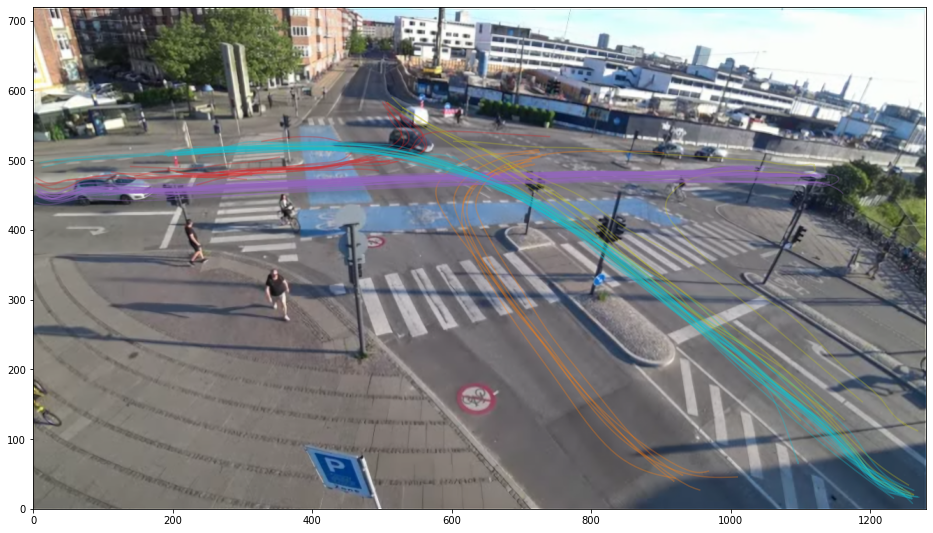

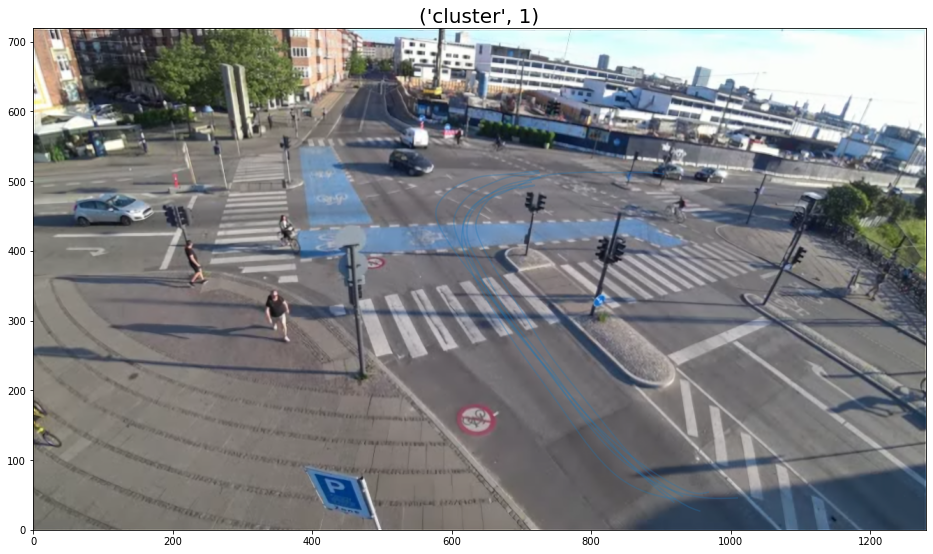

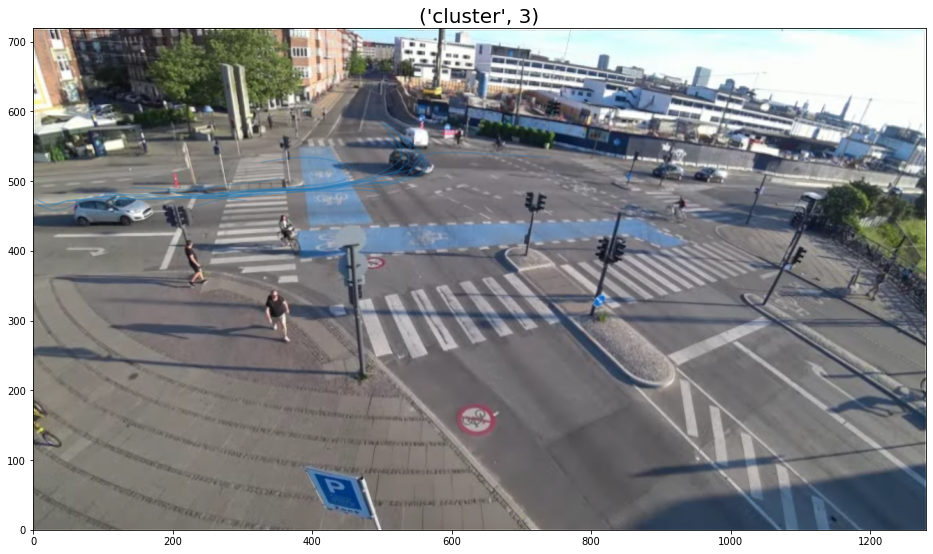

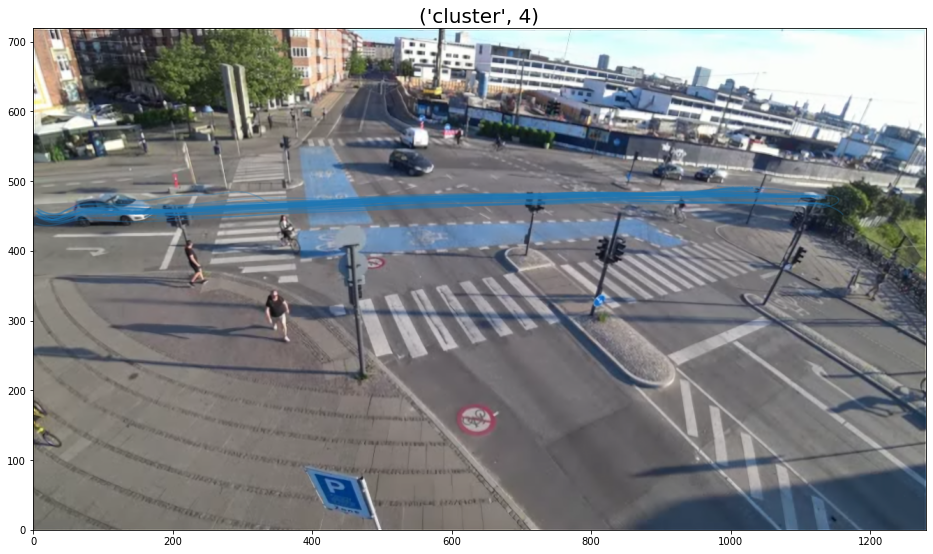

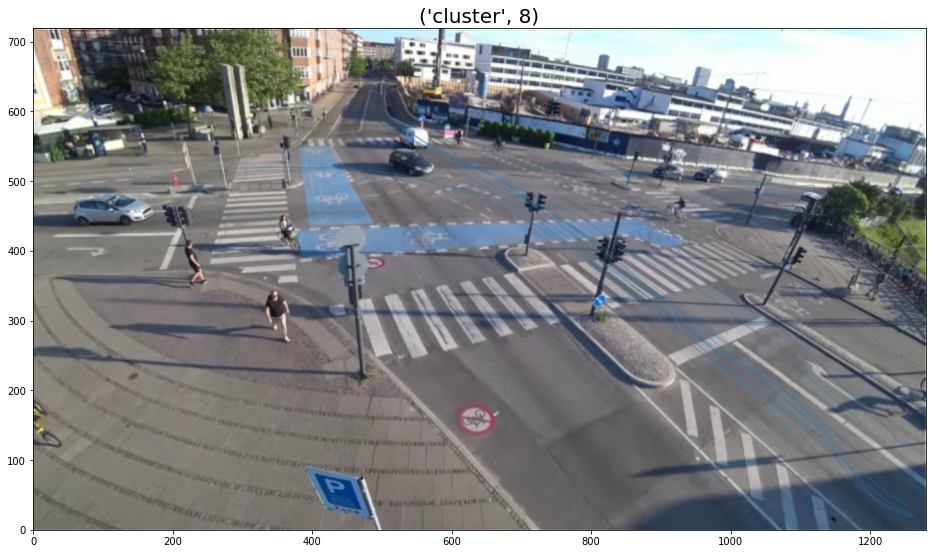

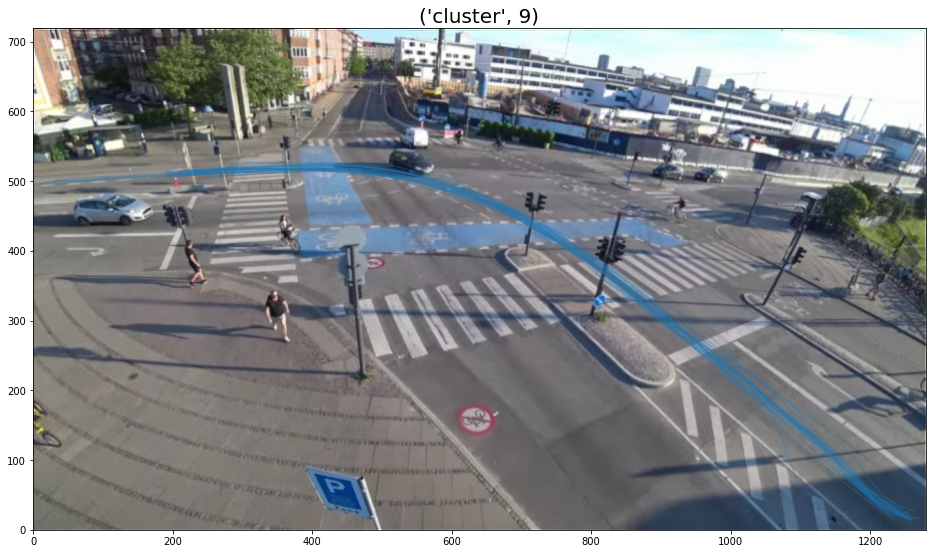

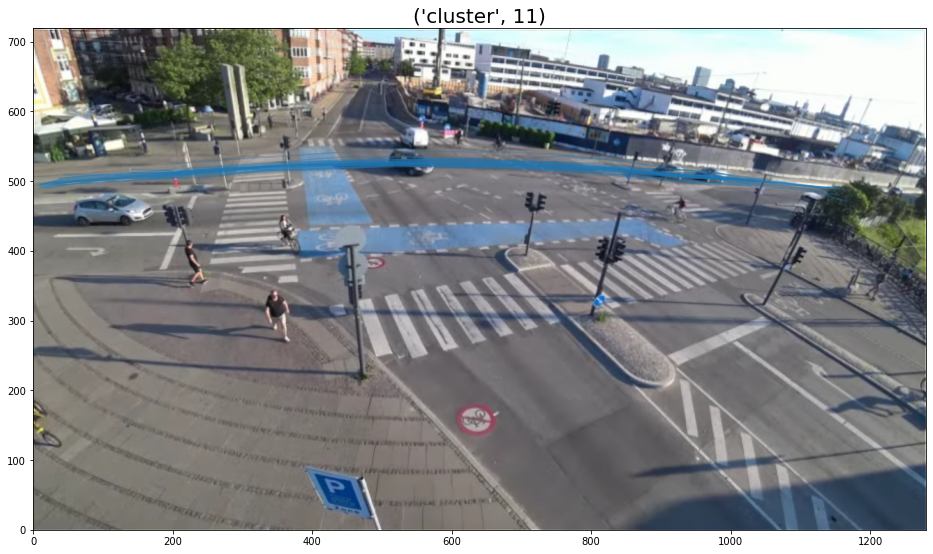

In [31]:
# PLOTTING THE OUTLIERS
col = sns.color_palette()
print('Plotting outliers in their respective cluster')
fig, ax = plt.subplots(figsize=(16, 16))
im = Image.open("intersection2.png")
im = ImageOps.flip(im)
ax.set_xlim(0, 1280)
ax.set_ylim(0, 720)
ax.imshow(im, origin='lower')
for _, row in df_o.iterrows():
    try:
        ax.plot(row['xs'], row['ys'], color=col[row['cluster']], alpha=0.3)
    except IndexError:
        continue
#plt.savefig('figs/all_clusters.svg', dpi=150)

for cluster in np.unique(df_o['cluster']):
    fig, ax = plt.subplots(figsize=(16, 16))
    im = Image.open("intersection2.png")
    im = ImageOps.flip(im)
    ax.set_xlim(0, 1280)
    ax.set_ylim(0, 720)
    ax.imshow(im, origin='lower')
    print('plotting cluster', cluster)
    df_c = df_o.loc[df_o['cluster'] == cluster]
    for _, row in df_c.iterrows():
        ax.set_title(label = ("cluster",cluster), fontsize=20)
        ax.plot(row['xs'], row['ys'], color=col[0], alpha=0.3)

In [57]:
import configparser

config = configparser.ConfigParser()
config.read('settings.ini')
(config['DEFAULT']['path']

str